In [55]:
#Bibliotèques utilisées
import os
from numpy.fft import fft
import numpy as np 
import matplotlib.pyplot as plt
import scipy.io.wavfile as wav
from playsound import playsound
from IPython.display import display, Audio


## 1.1 étude de la quantification

### QST 1.1

la fréquence d'échantillonnage Fe: 44100


la valeur maximal du signal audio : 16422


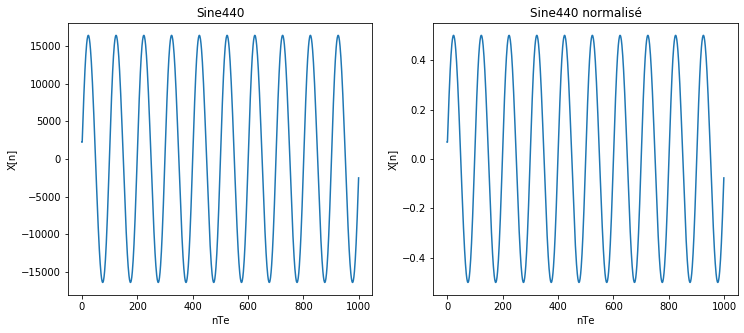

In [2]:
#from playsound import playsound
#playsound("sine440.wav")

### Question 1 

Fe, signal = wav.read('sine440.wav') # Récupération du signal et de la Fréquence d'échantillonage 
print("la fréquence d'échantillonnage Fe:",Fe)  #Fe = 44100Hz
display(Audio(signal,rate=Fe))

#Figure de Sine440
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.title("Sine440")
plt.ylabel("X[n]") 
plt.xlabel("nTe")
plt.plot(signal[0:1000])

#Figure de Sine440 normalisé
plt.subplot(1,2,2)
signal_norm = signal/2**15 # on déviser sur 
plt.title("Sine440 normalisé")
plt.ylabel("X[n]") 
plt.xlabel("nTe")
plt.plot(signal_norm[0:1000])

print("la valeur maximal du signal audio :",max(signal[0:100]))

### QST 1.2

In [3]:
def quantif(X, A, N):#(input sig, full-scall value, Number of bites)
    X = np.float64(X)
    high = A
    low = -1*A
    q = (high-low)/(2**N)
    Q = np.max(np.array([np.min(np.array([np.floor((X-low)/q), np.ones_like(X)*(2**N-1)]), axis = 0), np.zeros_like(X)]), axis = 0)
    low = low + q/2
    Y = low + q*Q
    return Y, q, Q #(quantization output, quant step, quantizd value (between 0 and 2^log2(N)-1))

remarque: le bruit de quantification est centré, E[bruit]=0
quantification par la loi du plus proche


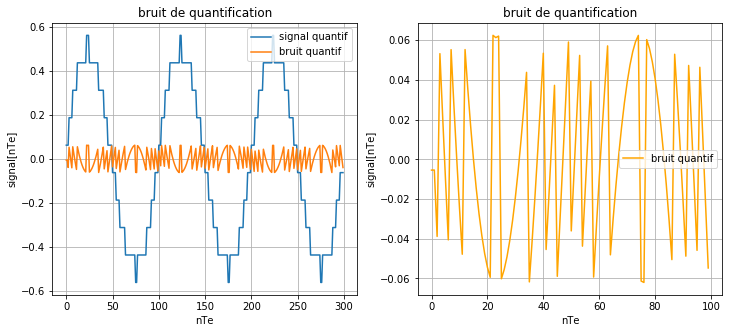

In [4]:
## Question 2
N=4  # Nombre de bits définit pour 2°)
A=1  #   A = max(|x|) définit pour 2°)

signalq, q,Q= quantif(signal_norm, A, N)

#BruitQuantif= SignalQ - Signal 
bruitq=signalq-signal_norm
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.title('sinal quantifié')
plt.xlabel('ehantillons')
plt.ylabel('N bits')
plt.plot(signalq[0:300],label='signal quantif')

plt.title('bruit de quantification')
plt.xlabel('nTe')
plt.ylabel('signal[nTe]')
plt.plot(bruitq[0:300],label='bruit quantif')
plt.legend()
plt.grid()

plt.subplot(1,2,2)
plt.title('bruit de quantification')
plt.xlabel('nTe')
plt.ylabel('signal[nTe]')
plt.plot(bruitq[0:100],label='bruit quantif',c='orange')
plt.legend()
plt.grid()

print("remarque: le bruit de quantification est centré, E[bruit]=0\nquantification par la loi du plus proche")

### QST 1.3

la moyenne du bruit:  2.763190237032313e-05
la variance de bruit : 0.0015618846949353332


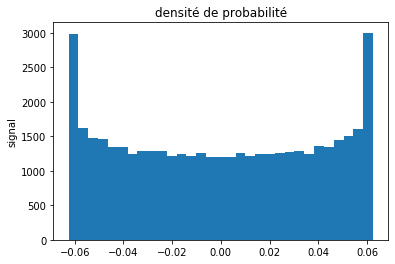

Remarque :
on constate que la densité de probabilité du bruit n'est pas constante, ce qui éloigne la possibilité
que le bruit soit un bruit blanc. aussi on constate que les valeurs des extrémités en -0.06 et 0.06 avec une densité de probabilité importante que les autres points et ça s'est du au variation rapide entre les extrémums


In [6]:
# études du bruit de quantif
moy=np.mean(bruitq)
var_bruit=np.var(bruitq)
print("la moyenne du bruit: ",moy)
print("la variance de bruit :", var_bruit)

# la densité de probabilité: 
# on a une densité de probabilité uniforme
prob=plt.hist(bruitq,bins='auto')
plt.title("densité de probabilité")
plt.ylabel("signal")
plt.show()

remrque_Q1_3="Remarque :\non constate que la densité de probabilité du bruit n'est pas constante, ce qui éloigne la possibilité\nque le bruit soit un bruit blanc. aussi on constate que les valeurs des extrémités en -0.06 et 0.06 avec une densité de probabilité importante que les autres points et ça s'est du au variation rapide entre les extrémums"
print(remrque_Q1_3)

### QST 1.4

Le rappport signal bruit SRBq= 6,02 * N -10*Log(F²/3)

avec F=A/segma(x)


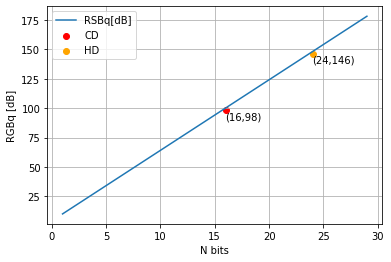

In [7]:
# le rapport signal buit RSBq:
segmaX=np.sqrt(np.var(signal_norm))
segmaB=np.sqrt(np.var(bruitq))
n=np.arange(start=1, stop=30, step=1)

F=max(signal_norm)/segmaX

L_RSBq=[]
for N in n:
    L_RSBq.append(6*N-10*np.log(F**2/3))

plt.plot(n,L_RSBq,label="RSBq[dB]")
plt.scatter(16,98,label="CD",c="r")
plt.scatter(24,146,label='HD',c="orange")
plt.xlabel("N bits")
plt.ylabel("RGBq [dB]")
plt.legend()
plt.text(x=16,y=90,s="(16,98)")
plt.text(x=24,y=139,s="(24,146)")
plt.grid()

### QST 1.5
le tracé du signal quantifié avec N=8 et A varie
on sait que le quantum q= 2*A/2^N
notre signal quantifié est normalisé

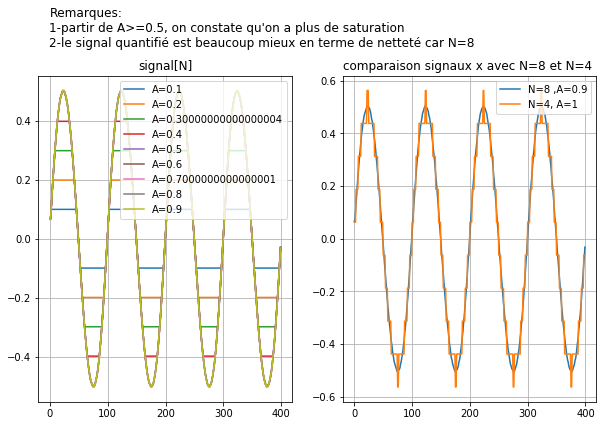

In [9]:
#la quantification sur 8 bits: 
N=8
A=np.arange(start=0.1,stop=1,step=0.1)

List_signaux_ai=[]
for a in A:
    signalq_8b, q,Q= quantif(signal_norm, a, N)
    List_signaux_ai.append(signalq_8b)
count=1
plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
plt.title("signal[N]")
for a,x in zip(A,List_signaux_ai):
    plt.plot(x[0:400],label="A="+str(a))
    plt.legend()
    plt.grid()
res="Remarques:\n"
res+="1-partir de A>=0.5, on constate qu'on a plus de saturation\n"
res+="2-le signal quantifié est beaucoup mieux en terme de netteté car N=8\n"
plt.text(x=-1,y=0.6,s=res,fontsize=12)

plt.subplot(1,2,2)
plt.title("comparaison signaux x avec N=8 et N=4 ")
plt.plot(List_signaux_ai[len(A)-1][0:400],label="N=8 ,A="+str(a))
plt.plot(signalq[0:400],label="N=4, A=1")
plt.legend()
plt.grid()




### QST 1.6
a) - Tracé de RSB en fonction de A:
RSBq= 6N - 10Log(F²/3)

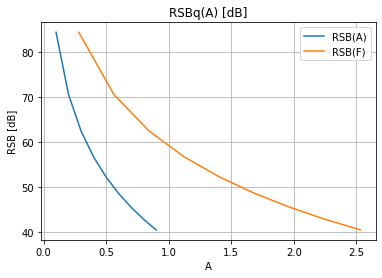

In [10]:
# question a)
N=8
A=np.arange(start=0.1,stop=1,step=0.1)
L_RSB_dB_A=[]
L_F=[]
for a in A:
    F=a/(np.sqrt(np.var(signalq_8b)))
    L_F.append(F)

    r=6*N-10*np.log(F**2/3)
    L_RSB_dB_A.append(r)
    


plt.title("RSBq(A) [dB]")
plt.plot(A,L_RSB_dB_A,label="RSB(A)")
plt.plot(L_F,L_RSB_dB_A,label="RSB(F)")
plt.xlabel("A")
plt.ylabel("RSB [dB]")
plt.legend()
plt.grid()

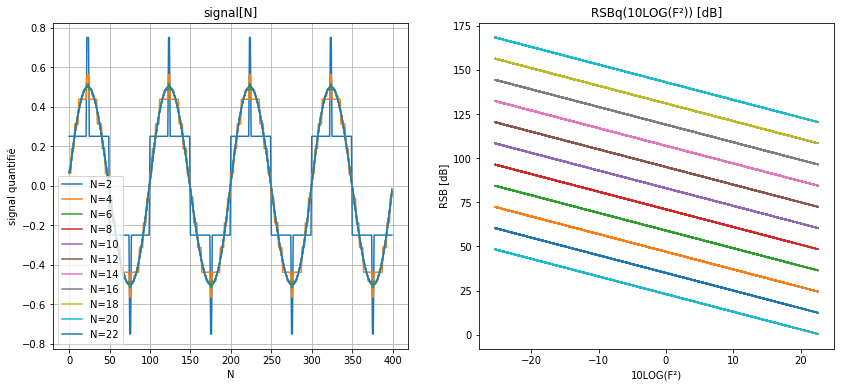

In [11]:
# question b)
N=np.arange(start=2,stop=24,step=2)
List_signaux_ai=[]
for n in N:
    signalq_N, q,Q= quantif(signal_norm, 1, n)
    List_signaux_ai.append(signalq_N)

count=1
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
plt.title("signal[N]")
plt.xlabel("N")
plt.ylabel("signal quantifié")
for n,x in zip(N,List_signaux_ai):
    plt.plot(x[0:400],label="N="+str(n))
    plt.legend()
    plt.grid()


L_RSB_dB_B=[]
L_10LOGF2=[]
A=np.arange(start=0.1,stop=1,step=0.1)
for x in List_signaux_ai:
    for a in A:
        F=a/(np.sqrt(np.var(x)))
        L_10LOGF2.append(10*np.log(F**2))
        r=6*N-10*np.log(F**2/3)
        L_RSB_dB_B.append(r)

plt.subplot(1,2,2)
plt.title("RSBq(10LOG(F²)) [dB]")
plt.xlabel("10LOG(F²)")
plt.ylabel("RSB [dB]")


count=0
for i in range(10):
    plt.plot(L_10LOGF2,L_RSB_dB_B)
    plt.grid() 

question c) 
si la pleine échelle est trop faible par rapport à la variance, cela implique que le Facteur de d'échelle soit faible, donc on aura rapidement une saturation du signal comme illustré dans la courbe de la question QST 1.5 

### QST 1.7
écouter le signal audio voice.wav 


fin de sauvegarde des sons quantifiés.
N=2 bits sound ...


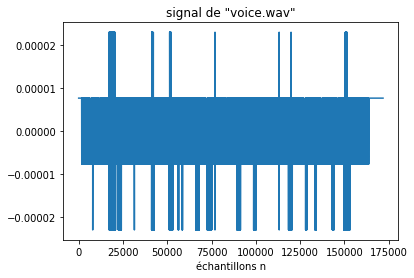

N=4 bits sound ...


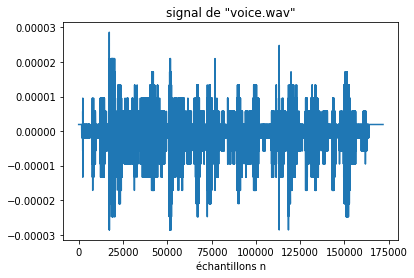

N=16 bits (CD) sound ...


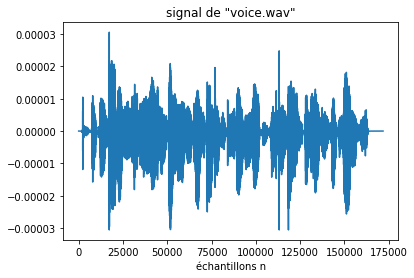

N=24 bits (HD) sound ...


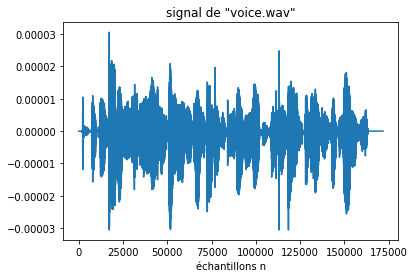

In [210]:
import os 

def graph(audio):
    #representation en fct des echantillons
    plt.figure()
    plt.title('signal de "voice.wav"')  #signal aujdio de voice
    plt.xlabel('échantillons n')
    plt.ylabel('')
    plt.plot(audio/2**15) #on divise par 2**15 les fichier.wav pour être converti en ‘float’ entre −1 et +1
    plt.show()


# quantifier le signal voice sur différents tailles de bits : N=2...24
fe, x= wav.read("voice.wav")


N=np.arange(start=2,stop=24,step=2)
x_norm=x/max(x)
L_x_q=[]
for n in N:
    L_x_q.append(quantif(x_norm,1,n)[0])

for i in range(len(N)):
    wav.write("soundsGenrated/"+"voice"+str(i)+".wav",fe,L_x_q[i])
print("fin de sauvegarde des sons quantifiés.")
#les sons générés sont dans le dossier soundsGenrated

#get directory:
dir=os.getcwd()
#change directory
try:
    os.chdir(dir+"/soundsGenrated")
    print("N=2 bits sound ...")
    Fe_voice, voice = wav.read('voice0.wav')
    display(Audio(voice,rate=Fe_voice))
    graph(voice)
    
    print("N=4 bits sound ...")
    Fe_voice, voice = wav.read('voice1.wav')
    display(Audio(voice,rate=Fe_voice))
    graph(voice)
    
    print("N=16 bits (CD) sound ...")
    Fe_voice, voice = wav.read('voice5.wav')
    display(Audio(voice,rate=Fe_voice))
    graph(voice)

    print("N=24 bits (HD) sound ...")
    Fe_voice, voice = wav.read('voice10.wav')
    display(Audio(voice,rate=Fe_voice))
    graph(voice)

    #get back to the first dir
    os.chdir('../')
except:
    pass

On constate que à partir de N=4 bits, on obtient un son de plus en plus net

## 1.2 Réechantillonnage et repliement spectral

### QST 1.2.1 
utilisation du signal rythmique.wav

In [109]:
fe, xR = wav.read('rythmique.wav') 
print("la fréquence Fe [xR] :",fe)  #Fe = 48000
x1=xR[:,0]
x2=xR[:,1]

print("son 1 ...")
display(Audio(x1,rate=fe))
print("son 2 ...")
display(Audio(x2,rate=fe))

la fréquence Fe [xR] : 48000
son 1 ...


/home/koussaila/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: WavFileWarning: Chunk (non-data) not understood, skipping it.
  """Entry point for launching an IPython kernel.


son 2 ...


### QST 1.2.2
affichage du signal en fonction du temps

(390615, 2)


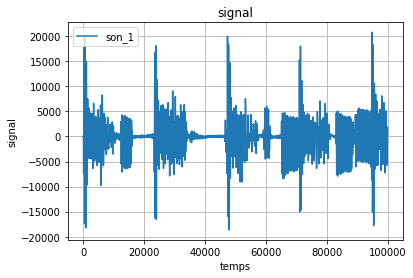

In [129]:
print(xR.shape)
#rendre le signal 
son_1=xR[:,0]
son_2=xR[:,1]
plt.plot(son_1[0:100000],label="son_1")
plt.title("signal")
plt.xlabel("temps")
plt.ylabel("signal")
plt.legend()
plt.grid()

### QST 1.2.3
le calcul et l'affichage du spectre:

la fréquence Fmax = 400 hz
la préquence d'échantillonnage Fs_min= 800 HZ


/home/koussaila/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


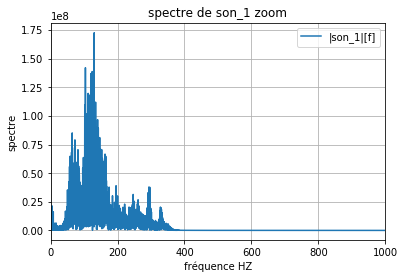

In [145]:
TFD=fft(son_1)
spectre=np.absolute(TFD)

fe=48000
freq=np.arange(0,fe,fe/len(spectre))

plt.figure()
plt.title("spectre de son_1 zoom")
plt.plot(freq,spectre,label="|son_1|[f]")
plt.xlabel("fréquence HZ")
plt.ylabel("spectre")
plt.xlim(0,1000)
plt.legend()
plt.grid()

Fmax=400
Fsmin=800
print("la fréquence Fmax = 400 hz")
print("la préquence d'échantillonnage Fs_min= 800 HZ")

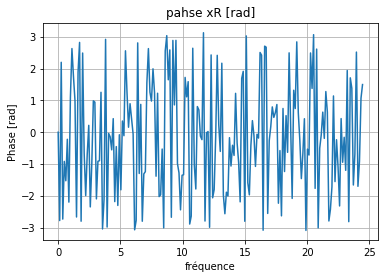

In [146]:
phase=np.angle(TFD)
phase=phase.reshape(phase.shape[0],1)
plt.plot(freq[0:200],phase[0:200])
plt.title("pahse xR [rad]")
plt.xlabel("fréquence")
plt.ylabel("Phase [rad]")
plt.grid()

### QST 1.2.4

sous échantillonage
$xR_dec  : ∀k ∈ Z, x dec [k] =x R [1 + (k − 1)N ]$.
#la valeur de N :
1.   la fréquence d'echantilllonage Fslow est 800 Hz 
donc N=48000/800=60

In [178]:
N=60
xR_dec=[]
i=0
while(i<=len(xR)):
    xR_dec.append(xR[i,0])
    i+=N

### QST 1.2.5
afifchage des deux signaux , signal d'origine et sous échantiollonné: 

/home/koussaila/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


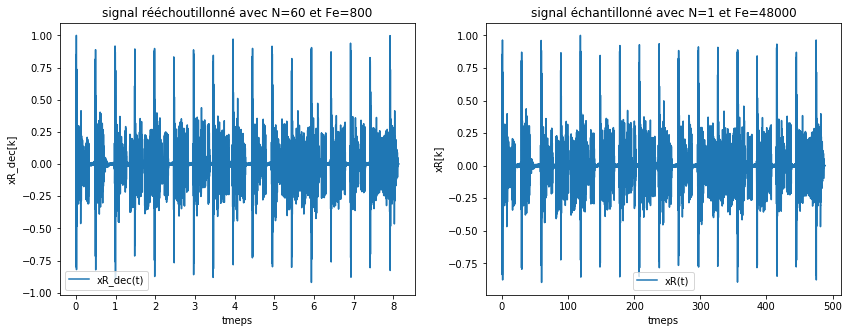

In [184]:
# plot du signal normalisé et ré échantillonné
temps=np.arange(len(xR_dec))/Fsmin
plt.figure(figsize=(14,5))
plt.subplot(1,2,1)
plt.plot(temps,xR_dec/max(xR_dec),label="xR_dec(t)")
plt.title("signal rééchoutillonné avec N=60 et Fe=800")
plt.xlabel("tmeps")
plt.ylabel("xR_dec[k]")
plt.legend()

te=np.arange(len(xR))/fe
plt.subplot(1,2,2)
plt.plot(te,son_1/max(son_1),label="xR(t)")
plt.title("signal échantillonné avec N=1 et Fe=48000")
plt.xlabel("tmeps")
plt.ylabel("xR[k]")
plt.legend()



#### remarque:
##### on constate qu'on a presque le même signal échantillonné pour les deux fréquence Fe=800 et Fe=48000 

### QST 1.2.6 
Calculer le spectre de xRdec (module et phase) sur un nombre de points fréquentiels égal à celui de xR . Quel est l’effet du sous-échantillonnage sur l’amplitude et la position des composantes fréquentielles ?

la fréquence Fmax = 400 hz
la préquence d'échantillonnage Fs_min= 800 HZ


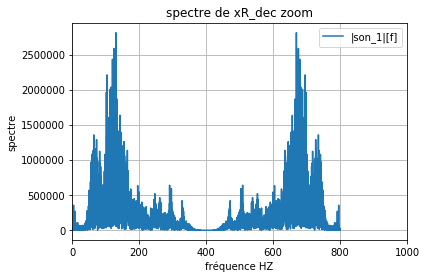

In [182]:
TFD=fft(xR_dec)
spectre=np.absolute(TFD)

fe=800
freq=np.arange(0,fe,fe/len(spectre))

plt.figure()
plt.title("spectre de xR_dec zoom")
plt.plot(freq,spectre,label="|son_1|[f]")
plt.xlabel("fréquence HZ")
plt.ylabel("spectre")
plt.xlim(0,1000)
plt.legend()
plt.grid()

Fmax=400
Fsmin=800
print("la fréquence Fmax = 400 hz")
print("la préquence d'échantillonnage Fs_min= 800 HZ")

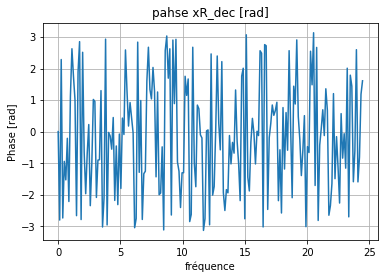

In [183]:
phase=np.angle(TFD)
phase=phase.reshape(phase.shape[0],1)
plt.plot(freq[0:200],phase[0:200])
plt.title("pahse xR_dec [rad]")
plt.xlabel("fréquence")
plt.ylabel("Phase [rad]")
plt.grid()

#### Remarques:
##### 1- on constate qu'on a la même phase pour les deux signaux xR et xR_dec,
##### 2- on constate qu'on a le même spectre pour  le sous échantillonnage que pour le signal d'origien car le théorème de shannon et bien respecté
##### 3- on voit aussi la périodisation du spectre, centré sur la fréquence d'échantillonnage Fe=800 hz

### QST 1.2.7 
Dans mon cas, l'estimation de la fréquence dééchantillonnage Fe=800 avec N=60 respecter toujours le théorème de shannon, donc logiquement j'obtient le même signal de départ qu'on je fais la réstitution, car on a pas un repliement spectrale. 

In [216]:
# on va echantillonner notre signal avec différente Fe, on prend même en compte les cas où repliement spectral

def transform(fe,signal):
    TFD=fft(signal)
    spectre=np.absolute(TFD)

    freq=np.arange(0,fe,fe/len(spectre))

    plt.figure()
    plt.title("spectre de xR_dec zoom")
    plt.plot(freq,spectre,label="|son_1|[f]")
    plt.xlabel("fréquence HZ")
    plt.ylabel("spectre")
    plt.xlim(0,1000)
    plt.legend()
    plt.grid()

def echantillonnage(N):
    xR_dec=[]
    i=0
    while(i<=len(xR)):
        xR_dec.append(xR[i,0])
        i+=N
    return xR_dec


L_x_q=[]
N=[68,80,96]
Fe=[700,600,500]
for n in N:
    L_x_q.append(echantillonnage(n))


# Piano:

# Partie 1 .2 .2

la fréquence d'échantillonnage Fe [xP] : 44100
Nombre d'echantillons : 500000
500000


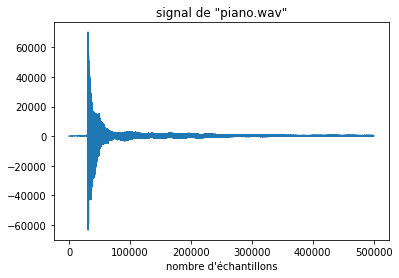

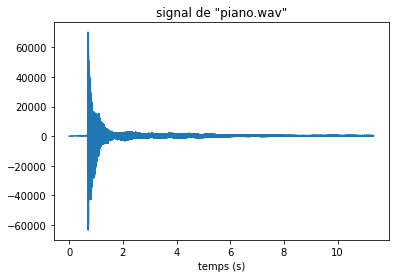

In [211]:
#Représentation du signal piano en fonction des echantillons et en fonctions du temps: 

from IPython.display import display, Audio

Fe_xP, xP = wav.read('piano.wav') 
print("la fréquence d'échantillonnage Fe [xP] :",Fe_xP)  #Fe = 44100
print("Nombre d'echantillons :",len(xP))
T_P = np.arange(0, len(xP)*1/Fe_xP, 1/Fe_xP)
print(len(T_P))
display(Audio(xP, rate=Fe_xP))  # signal audio de "piano.wav"

plt.figure()
plt.title('signal de "piano.wav"')
plt.xlabel("nombre d'échantillons")
plt.ylabel('')
plt.plot(xP/2*15) #on divise par 2*15 les fichier.wav pour être converti en ‘float’ entre −1 et +1
plt.show()

plt.figure()
plt.title('signal de "piano.wav"')
plt.xlabel("temps (s)")
plt.ylabel('')
plt.plot(T_P,xP/2*15) #on divise par 2*15 les fichier.wav pour être converti en ‘float’ entre −1 et +1
plt.show()

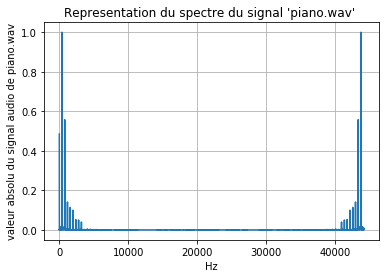

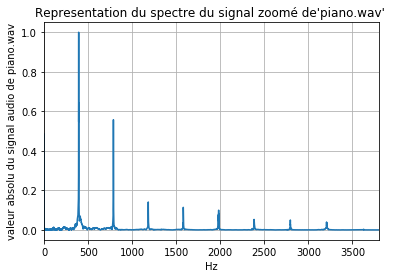

In [212]:
## Représentation spéctrale de notre signal piano.wav
#utilisation des méthodes vu lors des TP de TNS 

N = xP.shape[0]; f=np.linspace(0,Fe_xP,N)
tfd=np.fft.fft(xP)
tfd=abs(tfd)
tfd=tfd/tfd.max()
plt.figure()
plt.plot(f,tfd)
plt.xlabel("Hz")
plt.ylabel("valeur absolu du signal audio de piano.wav")
plt.title("Representation du spectre du signal 'piano.wav' ")
plt.grid()
plt.show()

plt.plot(f,tfd)
plt.xlabel("Hz")
plt.ylabel("valeur absolu du signal audio de piano.wav")
plt.title("Representation du spectre du signal zoomé de'piano.wav' ")
plt.xlim(0,3800)
plt.grid()
plt.show()


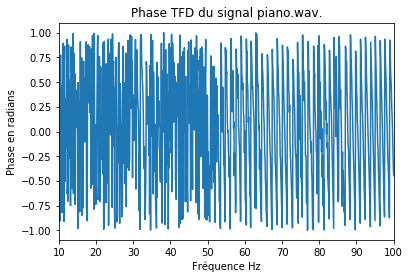

In [213]:
#représentation de la phase de notre signal piano.wav
tfd=np.fft.fft(xP)
tfd=np.angle(tfd)
tfd=tfd/tfd.max()
plt.figure()
plt.plot(f,tfd)
plt.title('Phase TFD du signal piano.wav.')
plt.xlabel('Fréquence Hz')
plt.ylabel('Phase en radians')
plt.xlim([10,100])
plt.show()  

On remarque que l'on a notre fréquence maximale a environ 3300Hz.

On prend donc un FsMin supérieur a 2*Fmax, on choisit 6800Hz pour respecter shannon

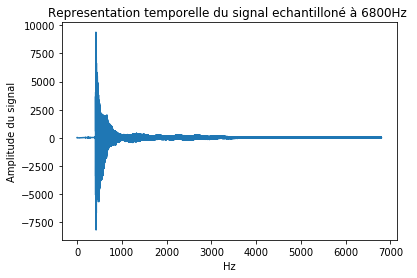

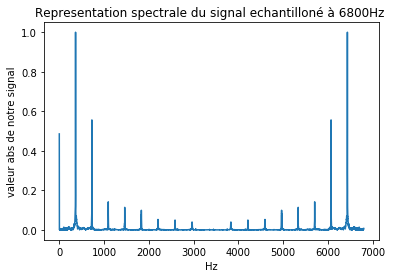

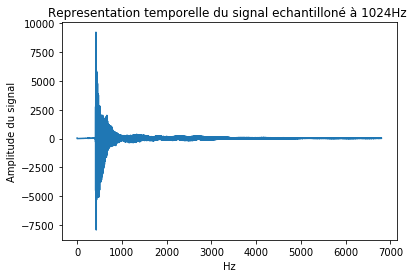

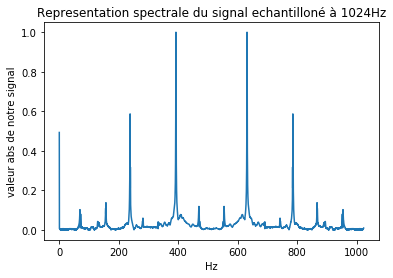

In [214]:
## Question 3 : 

#sous echantillonage à 6800Hz ( en respectant Shannon)
FsMin=6800
n=len(xP)
N=int(Fe_xP/FsMin)
taille=int(n/N)
Xp1Dec=np.zeros(taille)   # initialisation du vecteur de taille taille
for k in range (0,len(Xp1Dec)):
 Xp1Dec[k]=xP[1+(k-1)*N]


f=np.linspace(0,FsMin,taille)
plt.figure()
plt.plot(f,Xp1Dec)
plt.title("Representation temporelle du signal echantilloné à 6800Hz ")
plt.xlabel("Hz")
plt.ylabel("Amplitude du signal")


f=np.linspace(0,FsMin,len(Xp1Dec))
tfd=np.fft.fft(Xp1Dec)
tfd=abs(tfd)
tfd=tfd/tfd.max()
plt.figure()
plt.plot(f,tfd)
plt.xlabel("Hz")
plt.ylabel("valeur abs de notre signal")
plt.title("Representation spectrale du signal echantilloné à 6800Hz ")


#sous echantillonage à 1024Hz ( en ne respectant pas Shannon !! )

n=len(xP)
N=int(Fe_xP/1024)
taille2=int(n/N)
Xp2Dec=np.zeros(taille2)  # initialisation du vecteur de taille taille2
for k in range (0,len(Xp2Dec)):
  Xp2Dec[k]=xP[1+(k-1)*N]


f=np.linspace(0,FsMin,taille2)
plt.figure()
plt.plot(f,Xp2Dec)
plt.title("Representation temporelle du signal echantilloné à 1024Hz ")
plt.xlabel("Hz")
plt.ylabel("Amplitude du signal")


f=np.linspace(0,1024,len(Xp2Dec))
tfd=np.fft.fft(Xp2Dec)
tfd=abs(tfd)
tfd=tfd/tfd.max()
plt.figure()
plt.plot(f,tfd)
plt.title("Representation spectrale du signal echantilloné à 1024Hz")
plt.xlabel("Hz")
plt.ylabel("valeur abs de notre signal")
plt.show()



Question 4 

Pour l'echantillonage à 6800Hz l'intégralité du signal est bien échantillonnée et on n'a pas de perte d'information.
Pour l'échantillonage à 1024Hz, ici on à un phénomene de repliement spéctral, l'intégralité de l'information de notre signal
n'est pas restitué, on à alors une distorsion de notre signal que l'on peux voir dans notre représentation spéctrale. Seulement 3 pics de fréquences de notre signal de base est restitué dans le signal échantilloné à 1024Hz et on a l'apparation de bruit parasite que l'on peux observer dans la représentaiton spectrale du signal echantilloné à 1024Hz.

On a 3 pics sur la représentation spéctrale echantilloné a 1024Hz le pic le plus faible est celui de la deuxieme harmonique, dans ce signal echantilloné on recupere seulement la fondamentale et 2 harmoniques, les autres harmoniques ne sont pas conservés liés au repliement spectral. On a aussi la présence de bruit liée a ce phenomene.


 # BONUS

la fréquence d'échantillonnage Fe [xV] : 48000
Nombre d'echantillons : 468391


<ipython-input-71-738c37e7ff39>:2: WavFileWarning: Chunk (non-data) not understood, skipping it.
  Fe_xV, xV = wav.read('violon.wav')


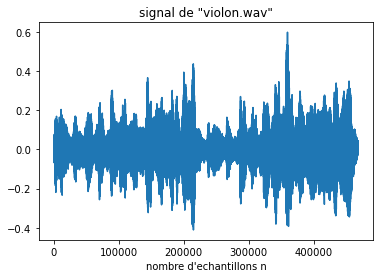

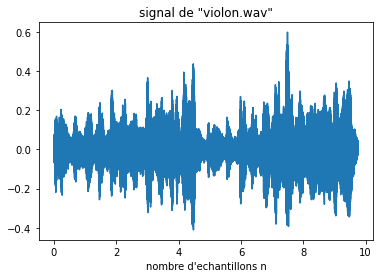

In [71]:
##VIOLON
Fe_xV, xV = wav.read('violon.wav') 
print("la fréquence d'échantillonnage Fe [xV] :",Fe_xV)  #Fe = 48000
print("Nombre d'echantillons :",len(xV))
T_V = np.arange(0, len(xV)*1/Fe_xV, 1/Fe_xV)
T_V=T_V[0:len(xV)]


display(Audio(xV, rate=Fe_xV))  # signal audio de "violon.wav"

plt.figure()
plt.title('signal de "violon.wav"')
plt.xlabel("nombre d'echantillons n")
plt.ylabel('')
plt.plot(xV/2**15) #on divise par 2**15 les fichier.wav pour être converti en ‘float’ entre −1 et +1
plt.show()

plt.figure()
plt.title('signal de "violon.wav"')
plt.xlabel("nombre d'echantillons n")
plt.ylabel('')
plt.plot(T_V,xV/2**15) #on divise par 2**15 les fichier.wav pour être converti en ‘float’ entre −1 et +1
plt.show()

<ipython-input-72-416a72a5e4a5>:2: WavFileWarning: Chunk (non-data) not understood, skipping it.
  Fe_xO, xO = wav.read('orchestre.wav')


la fréquence d'échantillonnage Fe [xO] : 48000
Nombre d'echantillons : 1157990


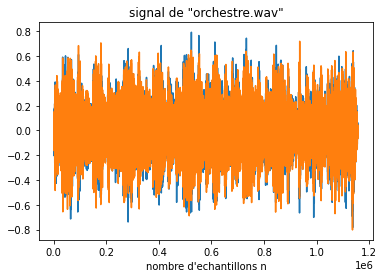

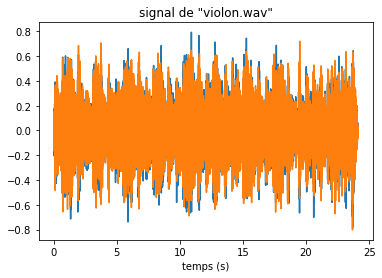

In [72]:
##ORCHESTRE
Fe_xO, xO = wav.read('orchestre.wav') 
print("la fréquence d'échantillonnage Fe [xO] :",Fe_xO)  #Fe = 44100
print("Nombre d'echantillons :",len(xO))
T_O = np.arange(0, len(xO*1)/Fe_xO, 1/Fe_xO)


xO1=[] #voix1
xO2=[] #voix2
for i in range(0,1157990):
    xO1.append(xO[i][0])
    xO2.append(xO[i][1])

display(Audio(xO1, rate=Fe_xO))  # signal audio de "orchestre.wav"
display(Audio(xO2, rate=Fe_xO))  # signal audio de "orchestre.wav"

#représentation en fct des echantillons
plt.figure()
plt.title('signal de "orchestre.wav"')
plt.xlabel("nombre d'echantillons n")
plt.ylabel('')
plt.plot(xO/2**15) #on divise par 2**15 les fichier.wav pour être converti en ‘float’ entre −1 et +1
plt.show()

#représentation en fct du temps
plt.figure()
plt.title('signal de "violon.wav"')
plt.xlabel("temps (s)")
plt.ylabel('')
plt.plot(T_O,xO/2**15) #on divise par 2**15 les fichier.wav pour être converti en ‘float’ entre −1 et +1
plt.show()